# **Segmentación Semántica de Residuos Sólidos: Implementación de Arquitectura Vision Transformer (ViT) from Scratch**

Autor: Bryan Daniel Martinez Cabezas


Materia: Inteligencia Artificial II

In [ ]:

import torch
import os
import sys
from google.colab import drive

# A. Montar Google Drive
print(" Conectando con Google Drive...")
drive.mount('/content/drive')

# B. Verificar la GPU que acabas de alquilar
print("\n Inspeccionando Hardware...")
if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    vram_gb = torch.cuda.get_device_properties(0).total_memory / 1e9

    print(f" ¡ÉXITO! GPU Detectada: {gpu_name}")
    print(f" VRAM Disponible: {vram_gb:.2f} GB")

PATH_BASE = '/content/drive/MyDrive/'

print(f"\n Directorio de trabajo raíz: {PATH_BASE}")

 Conectando con Google Drive...
Mounted at /content/drive

 Inspeccionando Hardware...
 ¡ÉXITO! GPU Detectada: NVIDIA A100-SXM4-40GB
 VRAM Disponible: 42.47 GB

 Directorio de trabajo raíz: /content/drive/MyDrive/


# Fase 1: Exploración y Análisis de Datos

In [ ]:
import os
import glob

# Definicion de la ruta base
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

print(f"--- Exploracion Basica del Dataset en: {BASE_DIR} ---")

# Verificacion de existencia del directorio
if os.path.exists(BASE_DIR):
    # Listado de carpetas que representan las clases
    clases = [d for d in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, d))]
    clases.sort()

    print(f"Total de Clases Encontradas: {len(clases)}")
    print("-" * 50)
    print(f"{'CLASE':<25} | {'IMAGENES (Aprox)':<15} | {'JSON DETECTADO'}")
    print("-" * 50)

    for clase in clases:
        ruta_clase = os.path.join(BASE_DIR, clase)

        # Busqueda rapida de imagenes jpg en cualquier subcarpeta
        # Se limita a contar archivos sin leerlos
        imgs = glob.glob(os.path.join(ruta_clase, '**', '*.jpg'), recursive=True)
        count_imgs = len(imgs)

        # Busqueda de archivo json con nombre coco_output
        jsons = glob.glob(os.path.join(ruta_clase, '**', '*coco*.json'), recursive=True)
        json_status = "SI" if jsons else "NO"

        print(f"{clase:<25} | {count_imgs:<15} | {json_status}")

    print("-" * 50)
else:
    print("Error: El directorio base no existe.")

--- Exploracion Basica del Dataset en: /content/drive/MyDrive/Dataset Oficial ---
Total de Clases Encontradas: 5
--------------------------------------------------
CLASE                     | IMAGENES (Aprox) | JSON DETECTADO
--------------------------------------------------
Blister                   | 10000           | SI
Cable                     | 10000           | SI
Cascaras_de_papa          | 13190           | SI
Cepillo_de_dientes        | 10000           | SI
Soldaditos                | 10000           | SI
--------------------------------------------------


In [ ]:
import os
import glob
import cv2
import numpy as np

# Ruta base del dataset
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def obtener_promedio_global(ruta_base, tamaño_muestra=500):
    # Recolectar todas las rutas de imagenes recursivamente
    # Se asume extension jpg segun exploracion previa
    todas_imagenes = glob.glob(os.path.join(ruta_base, '**', '*.jpg'), recursive=True)

    total_encontrado = len(todas_imagenes)

    if total_encontrado == 0:
        print("No se encontraron imagenes para analizar.")
        return

    # Seleccionar una muestra aleatoria para no procesar 50k imagenes
    # Esto da un promedio estadisticamente valido rapidamente
    rng = np.random.default_rng(42)
    if total_encontrado > tamaño_muestra:
        muestra = rng.choice(todas_imagenes, size=tamaño_muestra, replace=False)
    else:
        muestra = todas_imagenes

    anchos = []
    altos = []

    for ruta in muestra:
        img = cv2.imread(ruta)
        if img is not None:
            h, w = img.shape[:2]
            anchos.append(w)
            altos.append(h)

    if anchos:
        promedio_w = int(np.mean(anchos))
        promedio_h = int(np.mean(altos))

        print(f"--- Resultado Global (Muestra de {len(muestra)} imagenes) ---")
        print(f"Resolucion Promedio del Dataset: {promedio_w} x {promedio_h}")
    else:
        print("Error al leer las imagenes de la muestra.")

# Ejecutar calculo
if os.path.exists(BASE_DIR):
    obtener_promedio_global(BASE_DIR)
else:
    print(f"Ruta no encontrada: {BASE_DIR}")

--- Resultado Global (Muestra de 500 imagenes) ---
Resolucion Promedio del Dataset: 789 x 600


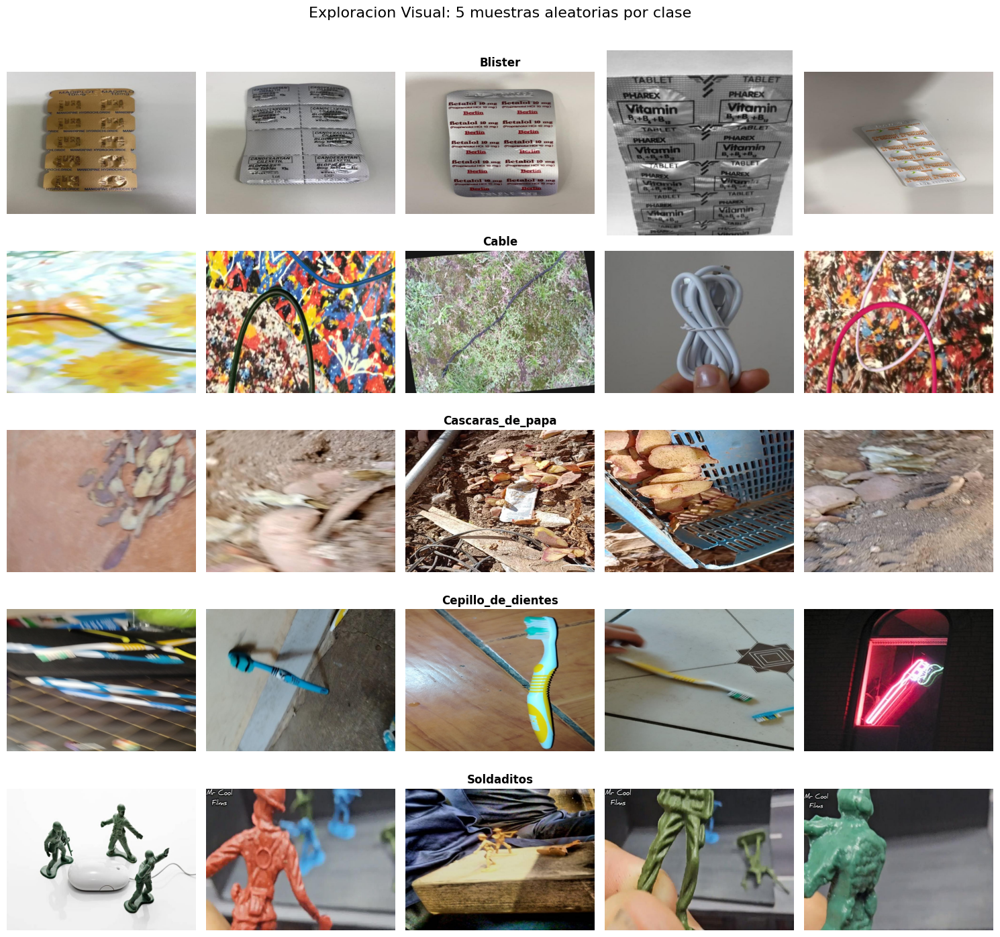

In [ ]:
import os
import glob
import random
import cv2
import matplotlib.pyplot as plt

# Definicion de la ruta base del dataset
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def visualizar_muestras_por_clase(base_dir, num_muestras=5):
    # Verificacion de existencia del directorio base
    if not os.path.exists(base_dir):
        print(f"Error: Ruta no encontrada en {base_dir}")
        return

    # Obtencion de la lista de clases ordenada alfabeticamente
    clases = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    clases.sort()

    total_clases = len(clases)
    if total_clases == 0:
        print("No se detectaron carpetas de clase.")
        return

    # Configuracion del lienzo de matplotlib
    # Se crea una grilla de (filas=clases, columnas=muestras)
    fig, axes = plt.subplots(total_clases, num_muestras, figsize=(15, 3 * total_clases))

    # Titulo general de la figura
    fig.suptitle(f'Exploracion Visual: {num_muestras} muestras aleatorias por clase', fontsize=16)

    for i, clase in enumerate(clases):
        ruta_clase = os.path.join(base_dir, clase)

        # Busqueda recursiva de imagenes jpg en la carpeta de la clase
        imagenes = glob.glob(os.path.join(ruta_clase, '**', '*.jpg'), recursive=True)

        # Seleccion de muestras
        # Si hay suficientes imagenes se usa random sample
        # Si no se toman todas las disponibles
        if len(imagenes) >= num_muestras:
            seleccion = random.sample(imagenes, num_muestras)
        else:
            seleccion = imagenes
            # Rellenar con None si faltan imagenes para completar la fila
            seleccion += [None] * (num_muestras - len(imagenes))

        # Iteracion por columnas para mostrar las imagenes
        for j, img_path in enumerate(seleccion):
            # Manejo de indices para subplot
            # Si hay una sola clase axes es 1D sino es 2D
            if total_clases > 1:
                ax = axes[i, j]
            else:
                ax = axes[j]

            if img_path:
                # Lectura de imagen con OpenCV
                img = cv2.imread(img_path)
                if img is not None:
                    # Conversion de espacio de color BGR a RGB para matplotlib
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    ax.imshow(img)
                else:
                    # Marcador visual en caso de imagen corrupta
                    ax.text(0.5, 0.5, 'Error Lectura', ha='center', va='center')
                    ax.set_facecolor('#f0f0f0')
            else:
                # Marcador visual si no hay imagen
                ax.text(0.5, 0.5, 'N/A', ha='center', va='center')

            # Configuracion de titulos y ejes
            # Solo se pone el titulo de la clase en la columna central
            if j == num_muestras // 2:
                ax.set_title(clase, fontsize=12, fontweight='bold')

            # Ocultar ejes coordenados para limpieza visual
            ax.axis('off')

    # Ajuste de espaciado para evitar superposiciones
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()

# Ejecucion de la funcion de visualizacion
visualizar_muestras_por_clase(BASE_DIR)

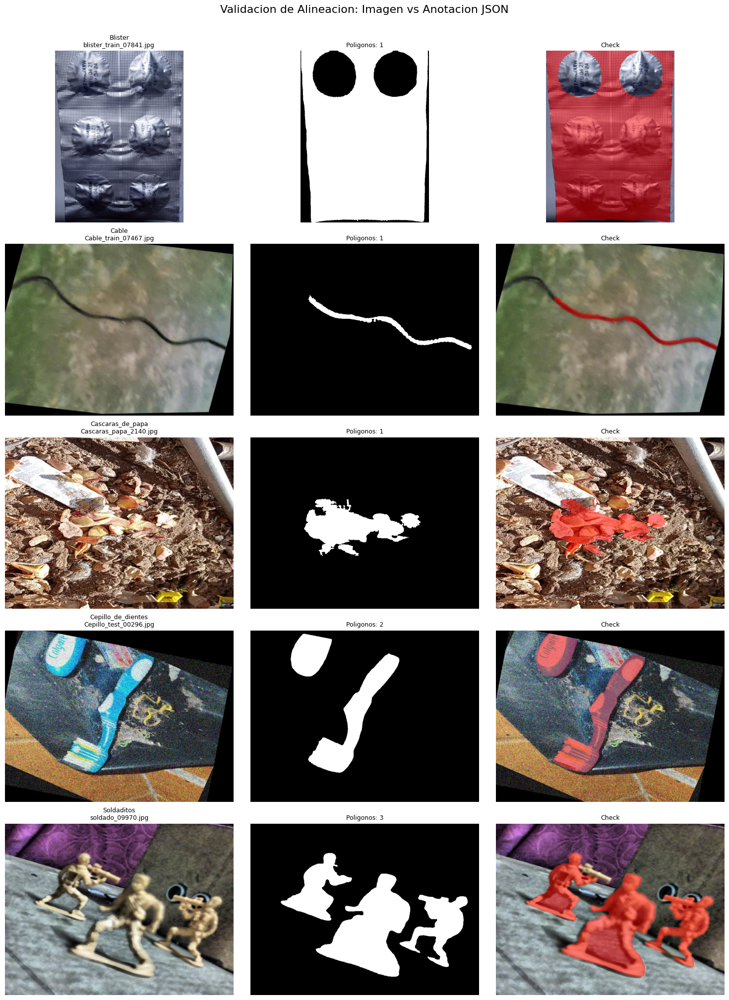

In [ ]:
import os
import json
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import glob

# Configuracion de rutas
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def encontrar_json_segmentacion_viz(ruta_clase):
    """
    Funcion auxiliar para localizar el JSON correcto (Segmentacion) y evitar Bboxes.
    """
    # 1. Buscar carpeta 'Segmentado' o similar
    try:
        subcarpetas = [d for d in os.listdir(ruta_clase) if os.path.isdir(os.path.join(ruta_clase, d))]
    except OSError:
        return None

    nombre_carpeta_seg = next((d for d in subcarpetas if 'seg' in d.lower()), None)

    ruta_busqueda = ruta_clase
    if nombre_carpeta_seg:
        ruta_busqueda = os.path.join(ruta_clase, nombre_carpeta_seg)

    # 2. Listar JSONs
    candidatos = glob.glob(os.path.join(ruta_busqueda, '*.json'))
    if not candidatos:
        candidatos = glob.glob(os.path.join(ruta_busqueda, '**', '*.json'), recursive=True)

    if not candidatos:
        return None

    # 3. Filtrar: Ignorar archivos con 'bbox' en el nombre
    json_validos = [c for c in candidatos if 'bbox' not in os.path.basename(c).lower()]

    if not json_validos:
        return None

    # 4. Priorizar archivos con 'seg' u 'output'
    prioritarios = [c for c in json_validos if 'seg' in os.path.basename(c).lower() or 'output' in os.path.basename(c).lower()]

    if prioritarios:
        return prioritarios[0]

    return json_validos[0]

def generar_visualizacion_mascaras(base_dir, muestras_por_clase=2):
    if not os.path.exists(base_dir):
        print(f"Error: Ruta base no existe.")
        return

    clases = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    clases.sort()

    # Configuracion del plot
    total_filas = len(clases) * muestras_por_clase
    # Ajuste de tamaño para evitar errores si no hay clases
    if total_filas == 0:
        print("No se encontraron clases.")
        return

    fig, axes = plt.subplots(total_filas, 3, figsize=(15, 4 * total_filas))
    plt.suptitle("Validacion de Alineacion: Imagen vs Anotacion JSON", fontsize=16, y=1.005)

    row_idx = 0

    for clase in clases:
        ruta_clase = os.path.join(base_dir, clase)

        # Uso de la funcion de busqueda robusta
        json_path = encontrar_json_segmentacion_viz(ruta_clase)

        if not json_path:
            # Manejo visual si no se encuentra JSON
            for _ in range(muestras_por_clase):
                for col in range(3):
                    # Manejo de ejes 1D/2D
                    if total_filas > 1:
                        ax = axes[row_idx, col]
                    else:
                        ax = axes[col]
                    ax.text(0.5, 0.5, f"Clase {clase}: JSON No encontrado", ha='center')
                    ax.axis('off')
                row_idx += 1
            continue

        # Carga de datos
        try:
            with open(json_path, 'r') as f:
                coco = json.load(f)
        except:
            print(f"Error leyendo JSON de {clase}")
            continue

        img_map = {img['id']: img for img in coco.get('images', [])}

        ann_map = {}
        for ann in coco.get('annotations', []):
            img_id = ann['image_id']
            if img_id not in ann_map:
                ann_map[img_id] = []
            ann_map[img_id].append(ann)

        # Localizacion de imagenes fisicas
        imgs_fisicas_paths = glob.glob(os.path.join(ruta_clase, '**', '*.jpg'), recursive=True)
        fisicas_map = {os.path.basename(p): p for p in imgs_fisicas_paths}

        valid_img_ids = []
        for img_id, img_meta in img_map.items():
            fname = os.path.basename(img_meta['file_name'])
            # Validar que exista imagen, anotacion y que la anotacion tenga segmentacion valida
            if img_id in ann_map and fname in fisicas_map:
                anns = ann_map[img_id]
                if any('segmentation' in a and a['segmentation'] for a in anns):
                    valid_img_ids.append(img_id)

        if len(valid_img_ids) >= muestras_por_clase:
            seleccion_ids = random.sample(valid_img_ids, muestras_por_clase)
        else:
            seleccion_ids = valid_img_ids

        # Generacion de graficos
        for i in range(muestras_por_clase):
            if total_filas > 1:
                ax_img = axes[row_idx, 0]
                ax_mask = axes[row_idx, 1]
                ax_over = axes[row_idx, 2]
            else:
                ax_img = axes[0]
                ax_mask = axes[1]
                ax_over = axes[2]

            if i < len(seleccion_ids):
                img_id = seleccion_ids[i]
                img_meta = img_map[img_id]
                anns = ann_map[img_id]

                fname = os.path.basename(img_meta['file_name'])
                full_path = fisicas_map[fname]

                img = cv2.imread(full_path)
                if img is not None:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    h, w = img.shape[:2]

                    # Mascara
                    mask = np.zeros((h, w), dtype=np.uint8)
                    for ann in anns:
                        if 'segmentation' in ann:
                            seg = ann['segmentation']
                            if isinstance(seg, list):
                                for poly in seg:
                                    pts = np.array(poly).reshape((-1, 1, 2)).astype(np.int32)
                                    # Relleno blanco para visualizacion
                                    cv2.fillPoly(mask, [pts], 255)

                    # Overlay
                    overlay = img.copy()
                    overlay[mask == 255] = [255, 0, 0]
                    cv2.addWeighted(overlay, 0.5, img, 0.5, 0, overlay)

                    ax_img.imshow(img)
                    ax_img.set_title(f"{clase}\n{fname}", fontsize=9)

                    ax_mask.imshow(mask, cmap='gray')
                    ax_mask.set_title(f"Poligonos: {len(anns)}", fontsize=9)

                    ax_over.imshow(overlay)
                    ax_over.set_title("Check", fontsize=9)
                else:
                    ax_img.text(0.5, 0.5, "Error Lectura")
            else:
                ax_img.text(0.5, 0.5, "Sin datos validos")

            ax_img.axis('off')
            ax_mask.axis('off')
            ax_over.axis('off')
            row_idx += 1

    plt.tight_layout()
    plt.show()

# Ejecucion
generar_visualizacion_mascaras(BASE_DIR, muestras_por_clase=1)

--- Recuento de Imagenes por Clase ---
Blister: 10000
Cable: 10000
Cascaras_de_papa: 13190
Cepillo_de_dientes: 10000
Soldaditos: 10000


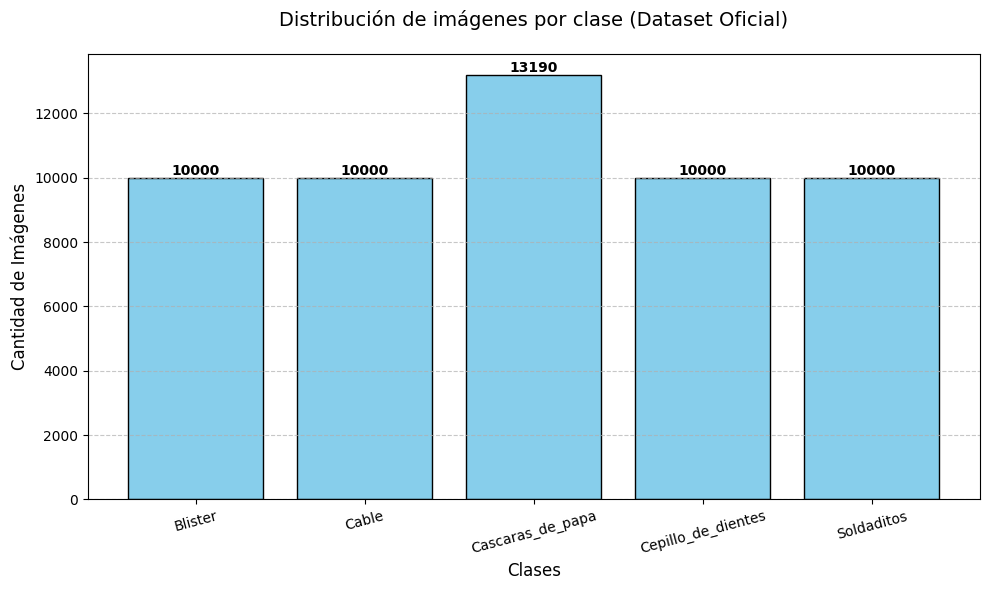

In [ ]:
import os
import glob
import matplotlib.pyplot as plt

# Configuracion de la ruta base
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def graficar_distribucion_clases(base_dir):
    # Validacion de ruta
    if not os.path.exists(base_dir):
        print(f"Error: La ruta {base_dir} no existe.")
        return

    # Obtencion de clases
    clases = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    clases.sort()

    conteos = []

    print("--- Recuento de Imagenes por Clase ---")

    for clase in clases:
        ruta_clase = os.path.join(base_dir, clase)

        # Busqueda recursiva de archivos .jpg
        # Esto asegura contar imagenes tanto en 'train/images' como en 'Segmentado/images'
        imagenes = glob.glob(os.path.join(ruta_clase, '**', '*.jpg'), recursive=True)

        # Agregamos conteo
        cantidad = len(imagenes)
        conteos.append(cantidad)
        print(f"{clase}: {cantidad}")

    # Generacion del Grafico
    plt.figure(figsize=(10, 6))
    barras = plt.bar(clases, conteos, color='#87CEEB', edgecolor='black') # Color Skyblue

    plt.title("Distribución de imágenes por clase (Dataset Oficial)", fontsize=14, pad=20)
    plt.xlabel("Clases", fontsize=12)
    plt.ylabel("Cantidad de Imágenes", fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(rotation=15) # Rotacion ligera para leer mejor los nombres

    # Añadir etiquetas de valor exacto sobre cada barra
    for barra in barras:
        altura = barra.get_height()
        plt.text(barra.get_x() + barra.get_width()/2., altura,
                 f'{int(altura)}',
                 ha='center', va='bottom', fontsize=10, fontweight='bold')

    plt.tight_layout()
    plt.show()

# Ejecucion
graficar_distribucion_clases(BASE_DIR)

# Fase 2: Procesamiento de Datos


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import cv2
import json
import os
import glob
import numpy as np

# Configuracion de Transformacion
TARGET_SIZE = 300
BATCH_SIZE = 16
NUM_WORKERS = 2

class ResiduosDatasetTransformer(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.samples = []

        # Mapeo explicito (El 0 es el fondo implícito generado por np.zeros)
        self.class_map = {
            'Blister': 1,
            'Cable': 2,
            'Cascaras_de_papa': 3,
            'Cepillo_de_dientes': 4,
            'Soldaditos': 5
        }

        self._indexar_archivos()

    def _recuperar_todos_jsons_segmentacion(self, ruta_clase):
        try:
            subcarpetas = [d for d in os.listdir(ruta_clase) if os.path.isdir(os.path.join(ruta_clase, d))]
        except OSError:
            return []

        carpeta_seg = next((d for d in subcarpetas if 'seg' in d.lower()), None)
        ruta_busqueda = os.path.join(ruta_clase, carpeta_seg) if carpeta_seg else ruta_clase

        candidatos = glob.glob(os.path.join(ruta_busqueda, '**', '*.json'), recursive=True)
        validos = [c for c in candidatos if 'bbox' not in os.path.basename(c).lower()]

        if not validos:
            return []

        prioritarios = [c for c in validos if 'seg' in os.path.basename(c).lower() or 'output' in os.path.basename(c).lower()]
        return prioritarios if prioritarios else validos

    def _indexar_archivos(self):
        if not os.path.exists(self.root_dir):
            return

        clases = sorted([d for d in os.listdir(self.root_dir) if os.path.isdir(os.path.join(self.root_dir, d))])

        for clase in clases:
            class_id = self.class_map.get(clase, 0)
            ruta_clase = os.path.join(self.root_dir, clase)

            json_paths = self._recuperar_todos_jsons_segmentacion(ruta_clase)

            if not json_paths:
                continue

            imgs_paths = glob.glob(os.path.join(ruta_clase, '**', '*.jpg'), recursive=True)
            path_map = {os.path.basename(p): p for p in imgs_paths}

            for json_path in json_paths:
                try:
                    with open(json_path, 'r') as f:
                        coco = json.load(f)

                    ann_index = {}
                    for ann in coco.get('annotations', []):
                        img_id = ann['image_id']
                        if img_id not in ann_index:
                            ann_index[img_id] = []
                        ann_index[img_id].append(ann)

                    for img_meta in coco.get('images', []):
                        fname = os.path.basename(img_meta['file_name'])
                        img_id = img_meta['id']

                        if fname in path_map:
                            anns = ann_index.get(img_id, [])
                            if any('segmentation' in a and a['segmentation'] for a in anns):
                                self.samples.append({
                                    'img_path': path_map[fname],
                                    'annotations': anns,
                                    'class_id': class_id
                                })

                except Exception:
                    pass

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        data = self.samples[idx]

        # 1. Cargar Imagen Original
        img = cv2.imread(data['img_path'])
        if img is None:
            # Manejo de error creando imagen negra vacia
            img = np.zeros((TARGET_SIZE, TARGET_SIZE, 3), dtype=np.uint8)
            h_orig, w_orig = TARGET_SIZE, TARGET_SIZE
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            h_orig, w_orig = img.shape[:2]

        # 2. Calcular factores de escala (Matemática Vectorial)
        scale_x = TARGET_SIZE / w_orig
        scale_y = TARGET_SIZE / h_orig

        # 3. Redimensionar Imagen (Lineal es correcto para fotos)
        img_resized = cv2.resize(img, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_LINEAR)

        # 4. Crear Máscara DIRECTAMENTE en 300x300 (Sin redimensionar después)
        mask = np.zeros((TARGET_SIZE, TARGET_SIZE), dtype=np.uint8) # Esto es la Clase 0 (Fondo)

        for ann in data['annotations']:
            if 'segmentation' in ann:
                seg = ann['segmentation']
                if isinstance(seg, list):
                    for poly in seg:
                        # Convertir lista plana a puntos (N, 1, 2)
                        pts_orig = np.array(poly).reshape((-1, 1, 2))

                        # APLICAR ESCALA A LOS VECTORES (Aquí está la magia anti-aliasing)
                        pts_scaled = pts_orig.astype(np.float32)
                        pts_scaled[:, :, 0] *= scale_x # Escalar X
                        pts_scaled[:, :, 1] *= scale_y # Escalar Y

                        # Convertir a enteros para dibujar
                        pts_final = pts_scaled.astype(np.int32)

                        # Dibujar polígono escalado con precisión
                        cv2.fillPoly(mask, [pts_final], data['class_id'])

        # 5. Convertir a Tensores
        img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).float() / 255.0
        mask_tensor = torch.from_numpy(mask).long()

        return img_tensor, mask_tensor

# Ejecucion de verificación
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

if os.path.exists(BASE_DIR):
    full_ds = ResiduosDatasetTransformer(BASE_DIR)

    if len(full_ds) > 0:
        img_t, mask_t = full_ds[0]
        print(f"Shape Imagen: {img_t.shape}, Shape Mascara: {mask_t.shape}")
    else:
        print("Error: Dataset vacio.")
else:
    print("Error: Ruta no encontrada.")

Shape Imagen: torch.Size([3, 300, 300]), Shape Mascara: torch.Size([300, 300])


Dimensiones verificadas.


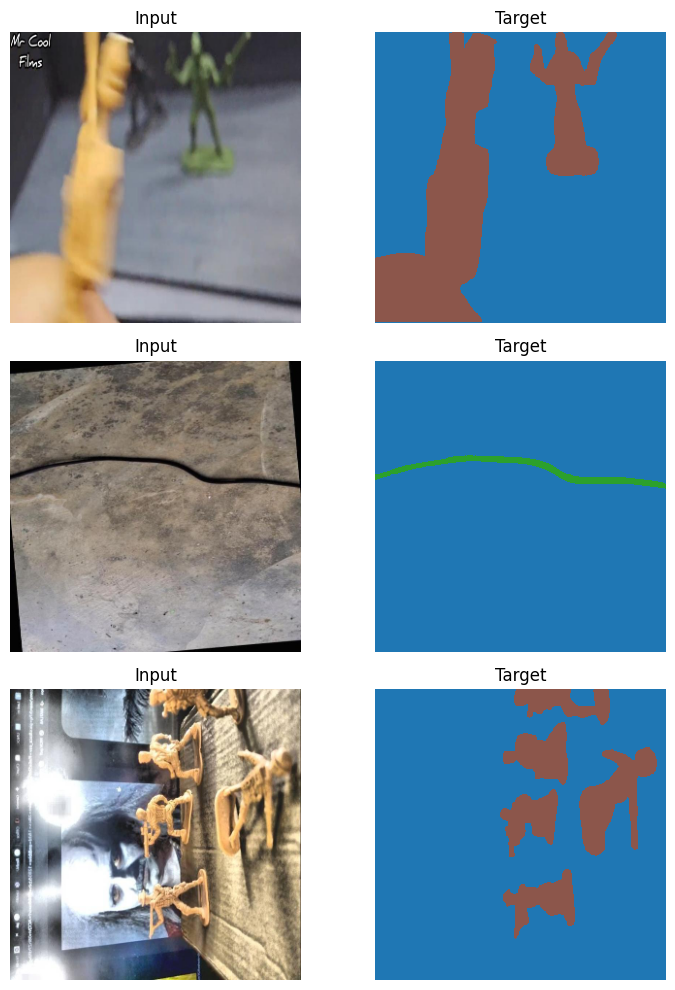

In [ ]:
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader

# Configuracion
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

ds = ResiduosDatasetTransformer(BASE_DIR)

if len(ds) > 0:
    # Loader temporal
    loader = DataLoader(ds, batch_size=4, shuffle=True)
    imgs, masks = next(iter(loader))

    # Validacion silenciosa
    assert imgs.shape == (4, 3, 300, 300)
    assert masks.shape == (4, 300, 300)

    print("Dimensiones verificadas.")

    # Visualizacion
    fig, ax = plt.subplots(3, 2, figsize=(8, 10))

    for i in range(3):
        img_np = imgs[i].permute(1, 2, 0).numpy()
        mask_np = masks[i].numpy()

        ax[i, 0].imshow(img_np)
        ax[i, 0].set_title("Input")
        ax[i, 0].axis('off')

        ax[i, 1].imshow(mask_np, cmap='tab10', vmin=0, vmax=10, interpolation='nearest')
        ax[i, 1].set_title("Target")
        ax[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

else:
    print("Error de carga.")

# Fase 3: Definiendo el modelo

Se implementa la arquitectura **Vision Transformer (ViT)** para segmentación semántica (*from scratch*). La arquitectura consta de:

1.  **Patch Embedding:** División de la imagen de entrada ($300 \times 300$) en parches de $15 \times 15$, resultando en una secuencia de $20 \times 20 = 400$ vectores.
2.  **Encoder Transformer:** Pila de bloques con mecanismo de Auto-Atención Multi-Cabezal (*Multi-Head Self-Attention*) y Perceptrones Multicapa (MLP).
3.  **Decoder de Segmentación:** Módulo de reconstrucción espacial que proyecta los embeddings del Transformer nuevamente a un mapa de características 2D y realiza un *Upsampling* para obtener la máscara de segmentación final de $300 \times 300$.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# 1. Configuracion del Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Hiperparametros de Entrada
IMG_SIZE = 300       # Resolucion de entrada estricta
PATCH_SIZE = 15      # Tamaño del parche
IN_CHANNELS = 3      # RGB

# 3. Hiperparametros de Arquitectura (ViT-Base Custom - AUMENTADOS)
# Antes: 256 dim, 6 capas, 8 cabezas.
# Ahora: Mas capacidad para aprovechar la A100 y mejorar precision.
EMBED_DIM = 768      # Aumentado de 256 -> 768 (Mas capacidad de informacion)
DEPTH = 12           # Aumentado de 6 -> 12 (Mas profundo, mejor razonamiento)
NUM_HEADS = 12       # Aumentado de 8 -> 12 (Mas atencion al detalle)
MLP_RATIO = 4.0      # Estandar (dim * 4 interna)

# 4. Hiperparametros de Salida
# Clases: 0=Fondo, 1=Blister, 2=Cable, 3=Papa, 4=Cepillo, 5=Soldaditos
NUM_CLASSES = 6

print(f"Configuracion ViT 'Turbo' Cargada en: {device}")
print(f"Estructura: Input {IMG_SIZE}x{IMG_SIZE}. Patches: {PATCH_SIZE}x{PATCH_SIZE}.")
print(f"Capacidad: Dim={EMBED_DIM}, Capas={DEPTH}, Cabezas={NUM_HEADS}")

Configuracion ViT 'Turbo' Cargada en: cuda
Estructura: Input 300x300. Patches: 15x15.
Capacidad: Dim=768, Capas=12, Cabezas=12


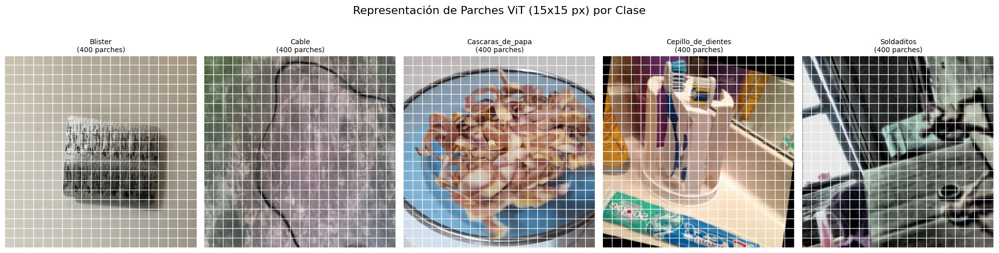

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

# Configuracion
IMG_SIZE = 300
PATCH_SIZE = 15
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

# Instancia de seguridad
if 'full_ds' not in locals():
    full_ds = ResiduosDatasetTransformer(BASE_DIR)

if len(full_ds) > 0:
    # Obtener lista de clases (invertir mapa para buscar por nombre)
    clases_nombres = sorted(full_ds.class_map.keys())
    num_clases = len(clases_nombres)

    # Configurar plot: 1 fila, 5 columnas (una por clase)
    fig, axes = plt.subplots(1, num_clases, figsize=(20, 5))
    plt.suptitle(f"Representación de Parches ViT ({PATCH_SIZE}x{PATCH_SIZE} px) por Clase", y=1.05, fontsize=16)

    # Grid auxiliar para separar parches visualmente
    grid_side = IMG_SIZE // PATCH_SIZE # 20

    for i, clase_nombre in enumerate(clases_nombres):
        # Buscar el primer indice que corresponda a esta clase
        target_id = full_ds.class_map[clase_nombre]
        idx_found = None

        # Busqueda lineal rapida (suficiente para visualizacion)
        for idx in range(len(full_ds)):
            if full_ds.samples[idx]['class_id'] == target_id:
                idx_found = idx
                # Saltamos un poco para variar si se ejecuta varias veces
                if np.random.rand() > 0.5:
                    break

        if idx_found is not None:
            img_tensor, _ = full_ds[idx_found]

            # LOGICA DE PARCHEADO (Unfold)
            # Cortar la imagen en tensores de 15x15
            patches = img_tensor.unfold(1, PATCH_SIZE, PATCH_SIZE).unfold(2, PATCH_SIZE, PATCH_SIZE)
            # Reordenar a secuencia plana: (N_Patches, 3, 15, 15)
            patches = patches.contiguous().view(3, -1, PATCH_SIZE, PATCH_SIZE).permute(1, 0, 2, 3)

            # Crear lienzo con bordes blancos para simular los vectores separados
            canvas_h = grid_side * (PATCH_SIZE + 1)
            canvas = np.ones((canvas_h, canvas_h, 3))

            for p_idx in range(patches.shape[0]):
                row = p_idx // grid_side
                col = p_idx % grid_side

                # Extraer parche numpy
                patch_np = patches[p_idx].permute(1, 2, 0).numpy()

                # Calcular posicion con borde
                y = row * (PATCH_SIZE + 1)
                x = col * (PATCH_SIZE + 1)

                canvas[y:y+PATCH_SIZE, x:x+PATCH_SIZE, :] = patch_np

            # Mostrar
            axes[i].imshow(canvas)
            axes[i].set_title(f"{clase_nombre}\n({patches.shape[0]} parches)", fontsize=10)
            axes[i].axis('off')
        else:
            axes[i].text(0.5, 0.5, "Sin datos", ha='center')

    plt.tight_layout()
    plt.show()

else:
    print("Error: Dataset no cargado.")

Esta celda define la clase MultiHeadAttention. Es el componente más importante porque implementa la ecuación fundamental del Transformer: $\text{Attention}(Q, K, V) = \text{softmax}(\frac{QK^T}{\sqrt{d_k}})V$.

In [ ]:
# --- CELDA 11: Mecanismo de Multi-Head Self-Attention (MHSA) ---
import torch
import torch.nn as nn

class MultiHeadAttention(nn.Module):
    def __init__(self, dim, num_heads=8, qkv_bias=False, attn_drop=0., proj_drop=0.):
        super().__init__()
        self.num_heads = num_heads
        head_dim = dim // num_heads
        self.scale = head_dim ** -0.5

        # Proyecciones lineales para Query, Key, Value
        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)

    def forward(self, x):
        B, N, C = x.shape

        # 1. Generacion de Q, K, V
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]

        # 2. Producto Punto Escalado
        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)

        # Optimización: Dropout en la atención
        attn = self.attn_drop(attn)

        # 3. Agregacion
        x = (attn @ v).transpose(1, 2).reshape(B, N, C)

        # 4. Proyeccion final con Dropout
        x = self.proj(x)
        x = self.proj_drop(x)
        return x

Esta celda encapsula la Atención junto con la Normalización y la Red Feed-Forward (MLP). Es la unidad repetitiva que da profundidad a la red.

In [ ]:
# --- CELDA 12: Bloque Transformer (Encoder) ---
# --- Funciones auxiliares para Stochastic Depth (DropPath) ---
def drop_path(x, drop_prob: float = 0., training: bool = False):
    """
    Descarta rutas (samples) enteras en el grafo residual durante el entrenamiento.
    """
    if drop_prob == 0. or not training:
        return x
    keep_prob = 1 - drop_prob
    shape = (x.shape[0],) + (1,) * (x.ndim - 1)
    random_tensor = keep_prob + torch.rand(shape, dtype=x.dtype, device=x.device)
    random_tensor.floor_()  # Binarizar
    output = x.div(keep_prob) * random_tensor
    return output

class DropPath(nn.Module):
    """Capa envoltorio para la función drop_path"""
    def __init__(self, drop_prob=None):
        super(DropPath, self).__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        return drop_path(x, self.drop_prob, self.training)

# --- Bloque Transformer Optimizado ---
class TransformerBlock(nn.Module):
    def __init__(self, dim, num_heads, mlp_ratio=4., drop=0., attn_drop=0., drop_path=0.):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = MultiHeadAttention(dim, num_heads=num_heads, attn_drop=attn_drop, proj_drop=drop)

        # Stochastic Depth (DropPath)
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

        self.norm2 = nn.LayerNorm(dim)
        hidden_dim = int(dim * mlp_ratio)

        self.mlp = nn.Sequential(
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(drop), # Regularización en MLP
            nn.Linear(hidden_dim, dim),
            nn.Dropout(drop)  # Regularización en MLP
        )

    def forward(self, x):
        # Conexión residual con DropPath
        x = x + self.drop_path(self.attn(self.norm1(x)))
        x = x + self.drop_path(self.mlp(self.norm2(x)))
        return x

Esta celda se encarga de "tokenizar" la imagen. Convierte el tensor 3D de entrada ($300 \times 300$) en una secuencia de vectores 1D.

In [ ]:
# --- CELDA 13: Patch Embedding (Tokenizacion de Imagen) ---
class PatchEmbedding(nn.Module):
    def __init__(self, img_size, patch_size, in_chans, embed_dim):
        super().__init__()
        self.img_size = img_size
        self.patch_size = patch_size
        self.n_patches = (img_size // patch_size) ** 2
        self.grid_size = img_size // patch_size

        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        x = self.proj(x)
        x = x.flatten(2).transpose(1, 2)
        return x

Esta celda realiza la operación inversa: toma la secuencia de vectores del Transformer y reconstruye espacialmente la imagen para generar la máscara de segmentación.

In [ ]:
# --- CELDA 14: Decoder de Segmentacion (Upsampling) ---
import torch.nn.functional as F

class ProgressiveDecoder(nn.Module):
    def __init__(self, embed_dim, num_classes):
        super().__init__()

        # --- ETAPA 1: Recuperación de Forma (20x20 -> 60x60) ---
        self.up1 = nn.Upsample(scale_factor=3, mode='bilinear', align_corners=False)
        self.conv1 = nn.Sequential(
            nn.Conv2d(embed_dim, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        # --- ETAPA 2: Refinamiento Final (60x60 -> 300x300) ---
        self.up2 = nn.Upsample(scale_factor=5, mode='bilinear', align_corners=False)
        self.conv2 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        # --- SALIDA ---
        self.final = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x, grid_size):
        B, N, C = x.shape
        H = W = grid_size

        x = x.transpose(1, 2).view(B, C, H, W)

        x = self.up1(x)
        x = self.conv1(x)

        x = self.up2(x)
        x = self.conv2(x)

        x = self.final(x)
        return x

Ensamblaje del Modelo (Clase Principal)

Esta celda une todas las piezas anteriores para formar el modelo completo ViTSegmenter.

In [ ]:
# --- CELDA 15: Modelo ViT Completo ---
class ViTSegmenter(nn.Module):
    def __init__(self, drop_rate=0.1, attn_drop_rate=0.1, drop_path_rate=0.1):
        super().__init__()

        # 1. Encoder (ViT Base Optimizado)
        self.patch_embed = PatchEmbedding(IMG_SIZE, PATCH_SIZE, IN_CHANNELS, EMBED_DIM)
        self.pos_embed = nn.Parameter(torch.zeros(1, self.patch_embed.n_patches, EMBED_DIM))
        self.pos_drop = nn.Dropout(p=drop_rate) # Dropout posicional

        # Regla de decaimiento estocástico de profundidad
        # La probabilidad de drop aumenta linealmente con la profundidad del bloque
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, DEPTH)]

        self.blocks = nn.ModuleList([
            TransformerBlock(
                dim=EMBED_DIM,
                num_heads=NUM_HEADS,
                mlp_ratio=MLP_RATIO,
                drop=drop_rate,
                attn_drop=attn_drop_rate,
                drop_path=dpr[i]
            ) for i in range(DEPTH)
        ])

        self.norm = nn.LayerNorm(EMBED_DIM)

        # 2. Decoder Progresivo
        self.decoder = ProgressiveDecoder(EMBED_DIM, NUM_CLASSES)

        # 3. Inicialización de Pesos
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            nn.init.trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, x):
        # --- Encoder ---
        x = self.patch_embed(x)
        x = x + self.pos_embed
        x = self.pos_drop(x) # Dropout inicial

        for blk in self.blocks:
            x = blk(x)

        x = self.norm(x)

        # --- Decoder ---
        mask = self.decoder(x, self.patch_embed.grid_size)
        return mask

print("Modelo ViT Optimizado (Dropout + Stochastic Depth + Weight Init) Instanciado.")

Modelo ViT Optimizado (Dropout + Stochastic Depth + Weight Init) Instanciado.


#Fase 4: Pruebas y Verificación de Aprendizaje


In [ ]:
import torch

# 1. Crear una instancia del modelo
model = ViTSegmenter()

print("Modelo Vision Transformer (Segmentacion) creado.")
print(f"Parametros totales: {sum(p.numel() for p in model.parameters()):,}")

# 2. Generar datos sinteticos para la prueba
batch_size = 4
dummy_input = torch.randn(batch_size, 3, IMG_SIZE, IMG_SIZE)

print(f"\nInput shape: {dummy_input.shape}")
print(f"Shape esperado de entrada: ({batch_size}, 3, {IMG_SIZE}, {IMG_SIZE})")

# 3. Realizar una pasada hacia adelante (Forward Pass)
# Se usa no_grad porque solo verificamos arquitectura, no entrenamos
with torch.no_grad():
    output = model(dummy_input)

print(f"Output shape: {output.shape}")
# Para segmentacion, esperamos: (Batch, Num_Clases, Alto, Ancho)
print(f"Shape esperado de salida: ({batch_size}, {NUM_CLASSES}, {IMG_SIZE}, {IMG_SIZE})")

# 4. Validacion estricta
expected_shape = (batch_size, NUM_CLASSES, IMG_SIZE, IMG_SIZE)
assert output.shape == expected_shape, f"Error: Dimensiones incorrectas. Se obtuvo {output.shape}"

print("\nTest de dimensiones superado. El modelo ensambla entrada y salida correctamente.")

Modelo Vision Transformer (Segmentacion) creado.
Parametros totales: 88,612,806

Input shape: torch.Size([4, 3, 300, 300])
Shape esperado de entrada: (4, 3, 300, 300)
Output shape: torch.Size([4, 6, 300, 300])
Shape esperado de salida: (4, 6, 300, 300)

Test de dimensiones superado. El modelo ensambla entrada y salida correctamente.


# FIT DE UNA MUESTRA


Iniciando prueba de sobreajuste unitaria en: cuda
Ejecutando iteraciones de entrenamiento...
Época 50/300 | Loss: 0.0991 | Accuracy: 96.07%
Época 100/300 | Loss: 0.0580 | Accuracy: 97.58%
Época 150/300 | Loss: 0.0436 | Accuracy: 98.23%
Época 200/300 | Loss: 0.0335 | Accuracy: 98.66%
Época 250/300 | Loss: 0.0197 | Accuracy: 99.20%
Época 300/300 | Loss: 0.0151 | Accuracy: 99.38%
Tiempo total de ejecución: 77.37s


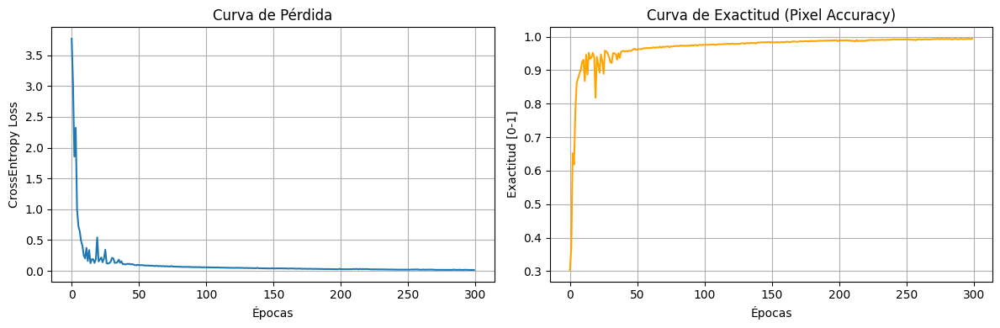

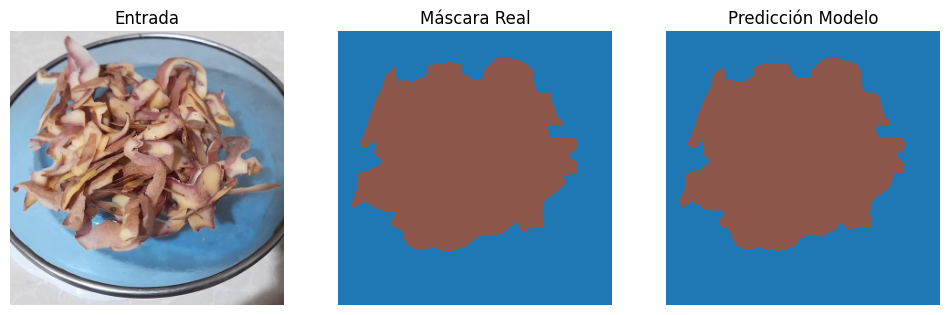

In [ ]:
import torch
import torch.optim as optim
import matplotlib.pyplot as plt
import time
import numpy as np

# Configuración del dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TEST_EPOCHS = 300
LEARNING_RATE = 1e-3

def calculate_pixel_accuracy(pred, target):
    """
    Calcula la exactitud pixel a pixel entre la predicción y el objetivo.
    """
    # Obtener la clase con mayor probabilidad
    pred_mask = torch.argmax(pred, dim=1)
    # Comparar con la máscara real
    correct = (pred_mask == target).float()
    # Calcular promedio
    acc = correct.sum() / correct.numel()
    return acc.item()

print(f"Iniciando prueba de sobreajuste unitaria en: {device}")

# 1. Instancia del modelo
model = ViTSegmenter().to(device)
model.train()

# 2. Obtención de una única muestra
np.random.seed(42)
if 'ds' not in locals():
    ds = ResiduosDatasetTransformer(BASE_DIR)

idx = np.random.randint(len(ds))
img_single, mask_single = ds[idx]

# Expansión de dimensiones para simular un batch
imgs = img_single.unsqueeze(0).repeat(4, 1, 1, 1).to(device)
masks = mask_single.unsqueeze(0).repeat(4, 1, 1).to(device)

# 3. Definición de función de pérdida y optimizador
criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=0.0)

# 4. Bucle de entrenamiento
losses = []
accuracies = []
start = time.time()

print("Ejecutando iteraciones de entrenamiento...")

for epoch in range(TEST_EPOCHS):
    optimizer.zero_grad()

    # Propagación hacia adelante
    outputs = model(imgs)
    loss = criterion(outputs, masks)

    # Cálculo de métricas
    acc = calculate_pixel_accuracy(outputs, masks)

    # Propagación hacia atrás y actualización de pesos
    loss.backward()
    optimizer.step()

    losses.append(loss.item())
    accuracies.append(acc)

    if (epoch + 1) % 50 == 0:
        print(f"Época {epoch + 1}/{TEST_EPOCHS} | Loss: {loss.item():.4f} | Accuracy: {acc:.2%}")

    # Criterio de parada temprana por convergencia
    if loss.item() < 0.005 and acc > 0.99:
        print(f"Convergencia alcanzada en época {epoch + 1}")
        break

print(f"Tiempo total de ejecución: {time.time() - start:.2f}s")

# 5. Visualización de resultados
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

# Gráfico de Pérdida
ax[0].plot(losses, label='Loss')
ax[0].set_title("Curva de Pérdida")
ax[0].set_xlabel("Épocas")
ax[0].set_ylabel("CrossEntropy Loss")
ax[0].grid(True)

# Gráfico de Exactitud
ax[1].plot(accuracies, color='orange', label='Accuracy')
ax[1].set_title("Curva de Exactitud (Pixel Accuracy)")
ax[1].set_xlabel("Épocas")
ax[1].set_ylabel("Exactitud [0-1]")
ax[1].grid(True)

plt.tight_layout()
plt.show()

# Validación visual de la predicción
model.eval()
with torch.no_grad():
    pred_logits = model(imgs[0:1])
    pred_mask = torch.argmax(pred_logits, dim=1).cpu().numpy()[0]

fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(img_single.permute(1, 2, 0).numpy())
ax[0].set_title("Entrada")
ax[0].axis('off')

ax[1].imshow(mask_single.numpy(), cmap='tab10', vmin=0, vmax=6, interpolation='nearest')
ax[1].set_title("Máscara Real")
ax[1].axis('off')

ax[2].imshow(pred_mask, cmap='tab10', vmin=0, vmax=6, interpolation='nearest')
ax[2].set_title("Predicción Modelo")
ax[2].axis('off')

plt.show()

Iniciando prueba de sobreajuste en batch de tamaño 4 con Weighted Loss...
Época 50/500 | Loss: 0.2756 | Accuracy: 95.34%
Época 100/500 | Loss: 0.2087 | Accuracy: 95.75%
Época 150/500 | Loss: 0.1876 | Accuracy: 93.05%
Época 200/500 | Loss: 0.1121 | Accuracy: 96.57%
Época 250/500 | Loss: 0.0760 | Accuracy: 97.35%
Época 300/500 | Loss: 0.0557 | Accuracy: 98.49%
Época 350/500 | Loss: 0.0365 | Accuracy: 99.22%
Época 400/500 | Loss: 0.0274 | Accuracy: 99.25%
Época 450/500 | Loss: 0.0227 | Accuracy: 99.41%
Época 500/500 | Loss: 0.0228 | Accuracy: 99.40%


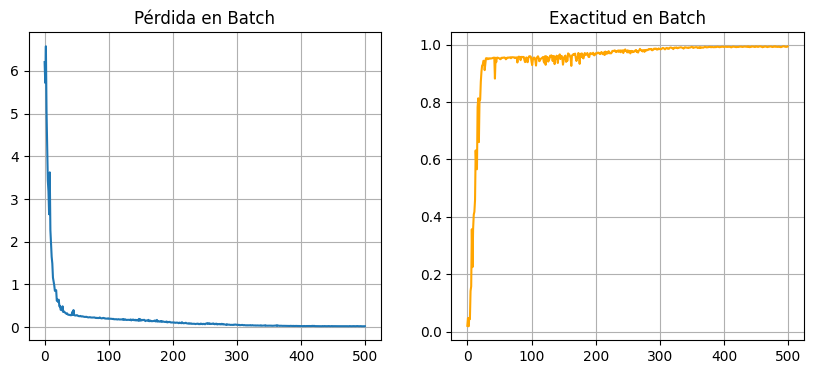

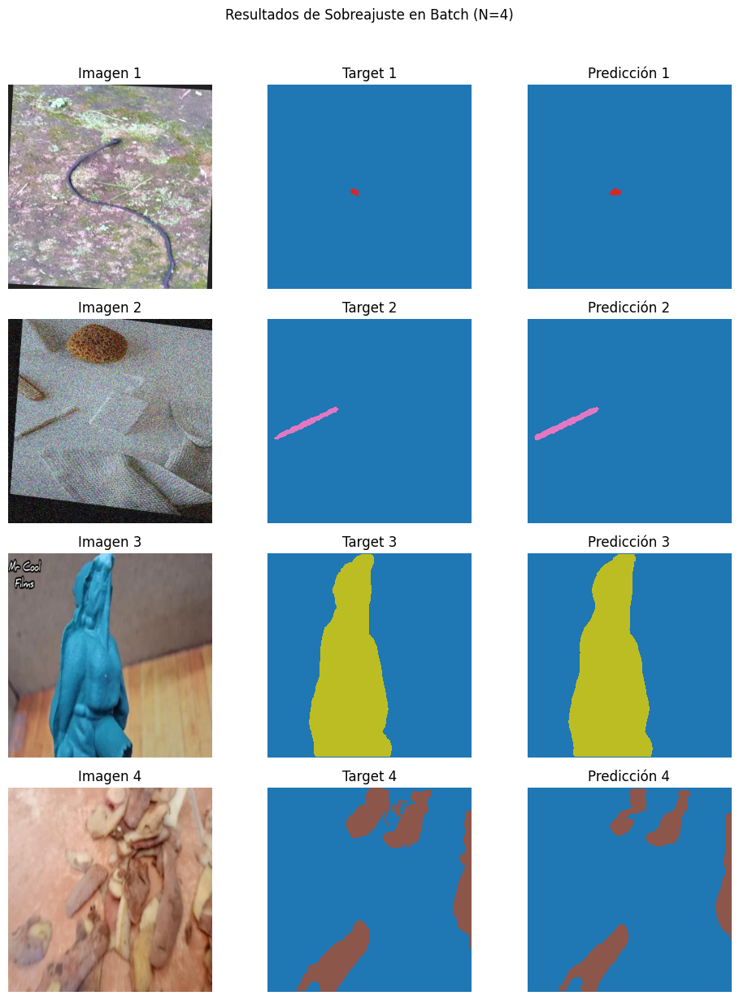

In [ ]:
import torch
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

# Configuración de prueba de lote
BATCH_TEST_SIZE = 4
BATCH_EPOCHS = 500
LR_BATCH = 5e-4 # Optimización 1: LR reducido
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Iniciando prueba de sobreajuste en batch de tamaño {BATCH_TEST_SIZE} con Weighted Loss...")

# 1. Preparación de datos (Se mantiene igual)
if 'ds' not in locals():
    # Asume que full_ds se cargó en Celda 7
    ds = full_ds
temp_loader = DataLoader(ds, batch_size=BATCH_TEST_SIZE, shuffle=True, drop_last=True)
imgs_batch, masks_batch = next(iter(temp_loader))

imgs_batch = imgs_batch.to(device)
masks_batch = masks_batch.to(device)

# 2. Reinicio del modelo y Optimización 2: Weighted Loss
model_batch = ViTSegmenter().to(device)
model_batch.train()

# Pesos de clase: Fondo (0) tiene peso 1. Objetos (1-5) tienen peso 3.
# Esto obliga al modelo a prestar más atención a los objetos.
class_weights = torch.ones(NUM_CLASSES).to(device)
class_weights[1:] = 3.0 # Las clases de objetos pesan 3x más

criterion = torch.nn.CrossEntropyLoss(weight=class_weights)
optimizer_batch = optim.AdamW(model_batch.parameters(), lr=LR_BATCH, weight_decay=0.0)

# 3. Bucle de sobreajuste del lote (Se mantiene igual)
batch_losses = []
batch_accs = []

def calculate_pixel_accuracy(pred, target):
    pred_mask = torch.argmax(pred, dim=1)
    correct = (pred_mask == target).float()
    return correct.sum() / correct.numel()

for epoch in range(BATCH_EPOCHS):
    optimizer_batch.zero_grad()
    outputs = model_batch(imgs_batch)
    loss = criterion(outputs, masks_batch)
    acc = calculate_pixel_accuracy(outputs, masks_batch)

    loss.backward()
    optimizer_batch.step()

    batch_losses.append(loss.item())
    batch_accs.append(acc.item())

    if (epoch + 1) % 50 == 0:
        print(f"Época {epoch + 1}/{BATCH_EPOCHS} | Loss: {loss.item():.4f} | Accuracy: {acc.item():.2%}")

    if acc.item() > 0.995 and loss.item() < 0.05:
        print(f"Objetivo alcanzado en época {epoch + 1}")
        break

# 4. Visualización (Se mantiene igual)
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(batch_losses)
plt.title("Pérdida en Batch")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(batch_accs, color='orange')
plt.title("Exactitud en Batch")
plt.grid(True)
plt.show()

# 5. Visualización cualitativa (Se mantiene igual)
model_batch.eval()
with torch.no_grad():
    preds = model_batch(imgs_batch)
    preds_masks = torch.argmax(preds, dim=1).cpu().numpy()

BATCH_TEST_SIZE = imgs_batch.shape[0]
fig, axes = plt.subplots(BATCH_TEST_SIZE, 3, figsize=(10, 3 * BATCH_TEST_SIZE))
plt.suptitle(f"Resultados de Sobreajuste en Batch (N={BATCH_TEST_SIZE})", y=1.02)

for i in range(BATCH_TEST_SIZE):
    img_disp = imgs_batch[i].cpu().permute(1, 2, 0).numpy()
    mask_disp = masks_batch[i].cpu().numpy()
    pred_disp = preds_masks[i]

    axes[i, 0].imshow(img_disp)
    axes[i, 0].set_title(f"Imagen {i+1}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(mask_disp, cmap='tab10', vmin=0, vmax=6, interpolation='nearest')
    axes[i, 1].set_title(f"Target {i+1}")
    axes[i, 1].axis('off')

    axes[i, 2].imshow(pred_disp, cmap='tab10', vmin=0, vmax=6, interpolation='nearest')
    axes[i, 2].set_title(f"Predicción {i+1}")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import torch
from torch.utils.data import DataLoader, random_split, Subset
import numpy as np
import os # Aseguramos que os esté importado

# --- CONFIGURACIÓN DE SUBSET ---
SUBSET_SIZE = 1000      # Número total de imágenes para la búsqueda de HParam
VAL_SUBSET_SPLIT = 0.2  # 20% para validación dentro del subset
HPARAM_BATCH_SIZE = 8   # Batch size para la búsqueda (moderado y estable)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Iniciando división de datos para búsqueda de hiperparámetros...")

# 1. Obtener la lista completa de índices (asumiendo que full_ds existe de Celda 7)
if 'full_ds' not in locals() or len(full_ds) == 0:
    # Si la variable full_ds no existe, la inicializamos
    BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'
    if not os.path.exists(BASE_DIR):
        print("Error: El directorio base no está montado.")
        # Generar un error para detener la ejecución
        raise FileNotFoundError("Ruta del Dataset no encontrada. Asegúrate de montar Google Drive.")

    full_ds = ResiduosDatasetTransformer(BASE_DIR)

total_indices = list(range(len(full_ds)))

# 2. Seleccionar un subconjunto aleatorio de índices
rng = np.random.default_rng(42) # Semilla fija para reproducibilidad
subset_indices = rng.choice(total_indices, size=SUBSET_SIZE, replace=False)

# 3. Crear el objeto Subset
subset_ds = Subset(full_ds, subset_indices)

# 4. Dividir el Subset en Entrenamiento y Validación (800/200)
val_subset_size = int(SUBSET_SIZE * VAL_SUBSET_SPLIT)
train_subset_size = SUBSET_SIZE - val_subset_size

train_subset_ds, val_subset_ds = random_split(
    subset_ds,
    [train_subset_size, val_subset_size],
    generator=torch.Generator().manual_seed(42)
)

print(f"\n--- Resumen del Subconjunto ---")
print(f"Total de imágenes seleccionadas para HParam: {SUBSET_SIZE}")
print(f"Conjunto de Entrenamiento (Train Subset): {len(train_subset_ds)}")
print(f"Conjunto de Validación (Val Subset): {len(val_subset_ds)}")

# 5. Crear DataLoaders
train_subset_loader = DataLoader(
    train_subset_ds,
    batch_size=HPARAM_BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)
val_subset_loader = DataLoader(
    val_subset_ds,
    batch_size=HPARAM_BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)
print("DataLoaders creados. Listos para la búsqueda de hiperparámetros")

Iniciando división de datos para búsqueda de hiperparámetros...

--- Resumen del Subconjunto ---
Total de imágenes seleccionadas para HParam: 1000
Conjunto de Entrenamiento (Train Subset): 800
Conjunto de Validación (Val Subset): 200
DataLoaders creados. Listos para la búsqueda de hiperparámetros


INICIANDO BÚSQUEDA DE HIPERPARÁMETROS
Configuraciones: 5 | Max Épocas: 20 | Paciencia: 5
--------------------------------------------------------------------------------

[Intento 1] Configuración: Equilibrado (Baseline)
Parámetros: LR=0.0001 | Drop=0.05
   Ep 5: IoU 0.0024 (Paciencia: 1/5)
   Ep 10: IoU 0.0896 (Paciencia: 1/5)
   Ep 15: IoU 0.1741 (Paciencia: 3/5)
   Ep 20: IoU 0.1393 (Paciencia: 1/5)
   Finalizado. Mejor IoU Local: 0.1850 (Tiempo: 542.6s)
   -> NUEVO MEJOR MODELO GLOBAL DETECTADO

[Intento 2] Configuración: Agresivo
Parámetros: LR=0.0005 | Drop=0.1
   Ep 5: IoU 0.0067 (Paciencia: 2/5)
   Ep 10: IoU 0.0470 (Paciencia: 1/5)
   DETENCIÓN TEMPRANA: No hubo mejora en 5 épocas.
   Finalizado. Mejor IoU Local: 0.0797 (Tiempo: 283.9s)

[Intento 3] Configuración: Preciso/Lento
Parámetros: LR=5e-05 | Drop=0.0
   Ep 5: IoU 0.0057 (Paciencia: 1/5)
   Ep 10: IoU 0.0494 (Paciencia: 1/5)
   Ep 15: IoU 0.1345 (Paciencia: 2/5)
   DETENCIÓN TEMPRANA: No hubo mejora en 5 épocas.
   Fin

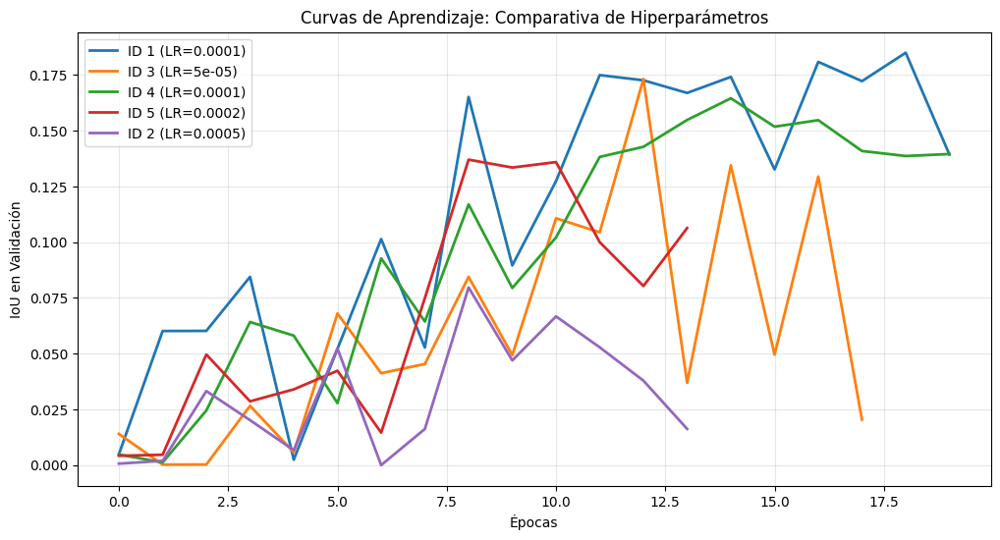

In [ ]:
import torch
import torch.optim as optim
import time
import numpy as np
import matplotlib.pyplot as plt

# --- CONFIGURACIÓN DE LA EJECUCIÓN ---
HPARAM_EPOCHS = 20      # Límite superior aumentado para permitir convergencia
PATIENCE = 5            # Paciencia "regular". Si no mejora en 8 épocas, se detiene.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- GRID DE HIPERPARÁMETROS (5 VARIANTES) ---
hyperparams_grid = [
    # 1. Baseline: Configuración estándar equilibrada
    {'id': 1, 'lr': 1e-4, 'drop_rate': 0.05, 'note': 'Equilibrado (Baseline)'},

    # 2. Agresivo: Alta tasa de aprendizaje con mayor dropout para compensar
    {'id': 2, 'lr': 5e-4, 'drop_rate': 0.10, 'note': 'Agresivo'},

    # 3. Conservador: Tasa baja sin regularización (ideal para estabilidad)
    {'id': 3, 'lr': 5e-5, 'drop_rate': 0.00, 'note': 'Preciso/Lento'},

    # 4. Alta Regularización: Para combatir overfitting severo si existiera
    {'id': 4, 'lr': 1e-4, 'drop_rate': 0.20, 'note': 'Alta Regularización'},

    # 5. Velocidad: Tasa media-alta con mínima regularización
    {'id': 5, 'lr': 2e-4, 'drop_rate': 0.02, 'note': 'Velocidad'},
]

def calculate_iou(pred, target, num_classes=6):
    """Calcula IoU promedio ignorando la clase fondo (0)."""
    pred_mask = torch.argmax(pred, dim=1)
    ious = []
    for cls in range(1, num_classes):
        pred_inds = (pred_mask == cls)
        target_inds = (target == cls)
        intersection = (pred_inds & target_inds).sum().float()
        union = (pred_inds | target_inds).sum().float()
        if union > 0:
            ious.append(intersection / union)
    return torch.tensor(ious).mean().item() if ious else 0.0

# Variables globales para el registro de resultados
best_overall_iou = 0.0
best_config = None
results_log = []

print(f"INICIANDO BÚSQUEDA DE HIPERPARÁMETROS")
print(f"Configuraciones: {len(hyperparams_grid)} | Max Épocas: {HPARAM_EPOCHS} | Paciencia: {PATIENCE}")
print("-" * 80)

start_global = time.time()

for config in hyperparams_grid:
    print(f"\n[Intento {config['id']}] Configuración: {config['note']}")
    print(f"Parámetros: LR={config['lr']} | Drop={config['drop_rate']}")

    # 1. Inicialización del Modelo
    model = ViTSegmenter(
        drop_rate=config['drop_rate'],
        attn_drop_rate=config['drop_rate'],
        drop_path_rate=config['drop_rate']
    ).to(device)

    # Configuración de pesos para CrossEntropy (Objetos tienen peso 3.0)
    class_weights = torch.ones(6).to(device)
    class_weights[1:] = 3.0
    criterion = torch.nn.CrossEntropyLoss(weight=class_weights)

    optimizer = optim.AdamW(model.parameters(), lr=config['lr'], weight_decay=1e-4)

    # 2. Bucle de Entrenamiento
    run_best_iou = 0.0
    val_ious = []
    patience_counter = 0 # Reiniciar contador de paciencia

    start_run = time.time()

    for epoch in range(HPARAM_EPOCHS):
        # Fase de Entrenamiento
        model.train()
        for imgs, masks in train_subset_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

        # Fase de Validación
        model.eval()
        iou_accum = 0
        with torch.no_grad():
            for imgs, masks in val_subset_loader:
                imgs, masks = imgs.to(device), masks.to(device)
                outputs = model(imgs)
                iou_accum += calculate_iou(outputs, masks)

        avg_iou = iou_accum / len(val_subset_loader)
        val_ious.append(avg_iou)

        # Lógica de Early Stopping y Checkpoint
        if avg_iou > run_best_iou:
            run_best_iou = avg_iou
            patience_counter = 0 # Se resetea la paciencia al mejorar
            # Guardamos temporalmente si supera al mejor global actual
            if run_best_iou > best_overall_iou:
                torch.save(model.state_dict(), 'vit_best_hparam_winner.pth')
        else:
            patience_counter += 1 # Se incrementa si no mejora

        # Reporte periódico
        if (epoch + 1) % 5 == 0:
            print(f"   Ep {epoch+1}: IoU {avg_iou:.4f} (Paciencia: {patience_counter}/{PATIENCE})")

        # Condición de Parada
        if patience_counter >= PATIENCE:
            print(f"   DETENCIÓN TEMPRANA: No hubo mejora en {PATIENCE} épocas.")
            break

    run_time = time.time() - start_run
    print(f"   Finalizado. Mejor IoU Local: {run_best_iou:.4f} (Tiempo: {run_time:.1f}s)")

    # Registro de datos
    results_log.append({
        'config': config,
        'best_iou': run_best_iou,
        'history': val_ious,
        'epochs_run': len(val_ious)
    })

    if run_best_iou > best_overall_iou:
        best_overall_iou = run_best_iou
        best_config = config
        print(f"   -> NUEVO MEJOR MODELO GLOBAL DETECTADO")

# --- INFORME FINAL ---
print("\n" + "="*80)
print("RESUMEN DE RESULTADOS")
print("="*80)

# Ordenar por IoU descendente
results_log.sort(key=lambda x: x['best_iou'], reverse=True)

for rank, res in enumerate(results_log):
    c = res['config']
    print(f"RANK #{rank+1} | ID {c['id']} ({c['note']})")
    print(f"   IoU: {res['best_iou']:.4f} | Épocas: {res['epochs_run']} | LR: {c['lr']} | Drop: {c['drop_rate']}")
    print("-" * 40)

print(f"\nCONCLUSIÓN:")
print(f"La configuración recomendada es la ID {best_config['id']} ({best_config['note']}).")
print(f"Hiperparámetros finales: Learning Rate = {best_config['lr']}, Drop Rate = {best_config['drop_rate']}")
print("="*80)

# Gráfico Comparativo
plt.figure(figsize=(12, 6))
for res in results_log:
    c = res['config']
    plt.plot(res['history'], label=f"ID {c['id']} (LR={c['lr']})", linewidth=2)

plt.title("Curvas de Aprendizaje: Comparativa de Hiperparámetros")
plt.xlabel("Épocas")
plt.ylabel("IoU en Validación")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# FASE 5: ENTRENAMIENTO

In [20]:
import shutil
import os
import time
import sys
from tqdm.auto import tqdm

# 1. Definición de rutas
SOURCE_DIR = '/content/drive/MyDrive/Dataset Oficial'
LOCAL_DIR = '/content/temp_dataset_local'

print("--- FASE 5.1: MIGRACIÓN DE DATOS Y OPTIMIZACIÓN DE I/O ---")
print(f"Directorio Origen: {SOURCE_DIR}")
print(f"Directorio Destino: {LOCAL_DIR}")

# 2. Limpieza de directorio local
if os.path.exists(LOCAL_DIR):
    print("[ADVERTENCIA] Directorio local previo detectado. Eliminando para asegurar integridad...")
    try:
        shutil.rmtree(LOCAL_DIR)
        print("[INFO] Limpieza completada.")
    except OSError as e:
        print(f"[ERROR] Fallo al eliminar directorio: {e}")
        sys.exit(1)

# 3. Función de Copia con Barra de Progreso
def copy_dataset_with_progress(src, dst):
    if not os.path.exists(dst):
        os.makedirs(dst)

    # Paso A: Conteo de archivos (Rápido)
    print("[INFO] Indexando archivos para calcular tiempo restante...")
    total_files = 0
    for root, dirs, files in os.walk(src):
        total_files += len(files)

    print(f"[INFO] Total de archivos a transferir: {total_files}")

    # Paso B: Copia iterativa
    copied_count = 0
    start_t = time.time()

    with tqdm(total=total_files, desc="Transfiriendo", unit="archivos") as pbar:
        for root, dirs, files in os.walk(src):
            # Crear estructura de carpetas en destino
            rel_path = os.path.relpath(root, src)
            dest_dir = os.path.join(dst, rel_path)

            if not os.path.exists(dest_dir):
                os.makedirs(dest_dir)

            # Copiar archivos individuales
            for file in files:
                src_file = os.path.join(root, file)
                dst_file = os.path.join(dest_dir, file)

                try:
                    shutil.copy2(src_file, dst_file) # copy2 preserva metadatos
                    copied_count += 1
                    pbar.update(1)
                except Exception as e:
                    print(f"\n[ERROR] No se pudo copiar {src_file}: {e}")

    return copied_count

# Ejecución de la copia
print("[INFO] Iniciando transferencia controlada...")
try:
    start_time = time.time()
    total_copied = copy_dataset_with_progress(SOURCE_DIR, LOCAL_DIR)
    elapsed_time = (time.time() - start_time) / 60
    print(f"\n[ÉXITO] Migración completada. {total_copied} archivos en {elapsed_time:.2f} minutos.")
except Exception as e:
    print(f"\n[ERROR CRÍTICO] Falló la transferencia: {e}")
    sys.exit(1)

# 4. Reinicialización del Dataset
print("[INFO] Reinicializando instancia del Dataset con rutas locales...")
full_ds = ResiduosDatasetTransformer(LOCAL_DIR)

print(f"[INFO] Total de imágenes disponibles (SSD Local): {len(full_ds)}")
print("[INFO] Sistema listo para la Fase 5.2.")

--- FASE 5.1: MIGRACIÓN DE DATOS Y OPTIMIZACIÓN DE I/O ---
Directorio Origen: /content/drive/MyDrive/Dataset Oficial
Directorio Destino: /content/temp_dataset_local
[ADVERTENCIA] Directorio local previo detectado. Eliminando para asegurar integridad...
[INFO] Limpieza completada.
[INFO] Iniciando transferencia controlada...
[INFO] Indexando archivos para calcular tiempo restante...
[INFO] Total de archivos a transferir: 111388


Transfiriendo:   0%|          | 0/111388 [00:00<?, ?archivos/s]


[ÉXITO] Migración completada. 111388 archivos en 30.92 minutos.
[INFO] Reinicializando instancia del Dataset con rutas locales...
[INFO] Total de imágenes disponibles (SSD Local): 42181
[INFO] Sistema listo para la Fase 5.2.


In [21]:
import torch
from torch.utils.data import DataLoader, Subset, random_split
import numpy as np
from collections import defaultdict

# --- CONFIGURACIÓN DE DATASET ---
SAMPLES_PER_CLASS = 5000
BATCH_SIZE = 16
NUM_WORKERS = 2
RANDOM_SEED = 42

print("--- FASE 5.2: BALANCEO DE CLASES Y PARTICIÓN DE DATOS ---")

# 1. Estratificación por índices de clase
indices_por_clase = defaultdict(list)

# Iteración eficiente sobre metadatos
for idx, sample in enumerate(full_ds.samples):
    class_id = sample['class_id']
    indices_por_clase[class_id].append(idx)

balanced_indices = []
rng = np.random.default_rng(RANDOM_SEED)

# Selección de muestras (Clases 1 a 5)
print(f"[INFO] Seleccionando {SAMPLES_PER_CLASS} muestras por clase...")
for class_id in range(1, 6):
    indices = indices_por_clase[class_id]
    total_available = len(indices)

    if total_available >= SAMPLES_PER_CLASS:
        selection = rng.choice(indices, size=SAMPLES_PER_CLASS, replace=False)
    else:
        print(f"[ADVERTENCIA] La clase {class_id} tiene muestras insuficientes ({total_available}). Usando todas las disponibles.")
        selection = indices

    balanced_indices.extend(selection)

# 2. Creación del Subconjunto Balanceado
balanced_ds = Subset(full_ds, balanced_indices)
total_samples = len(balanced_ds)

# 3. Particionamiento (70% Train, 20% Val, 10% Test)
train_size = int(0.7 * total_samples)
val_size = int(0.2 * total_samples)
test_size = total_samples - train_size - val_size

train_ds, val_ds, test_ds = random_split(
    balanced_ds,
    [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(RANDOM_SEED)
)

print(f"[INFO] Resumen del Dataset:")
print(f"   Total Imágenes: {total_samples}")
print(f"   Set Entrenamiento: {len(train_ds)}")
print(f"   Set Validación:    {len(val_ds)}")
print(f"   Set Prueba:        {len(test_ds)}")

# 4. Generación de DataLoaders
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

print("[INFO] DataLoaders inicializados correctamente.")

--- FASE 5.2: BALANCEO DE CLASES Y PARTICIÓN DE DATOS ---
[INFO] Seleccionando 5000 muestras por clase...
[INFO] Resumen del Dataset:
   Total Imágenes: 25000
   Set Entrenamiento: 17500
   Set Validación:    5000
   Set Prueba:        2500
[INFO] DataLoaders inicializados correctamente.


In [23]:
import torch.optim as optim
import time
import os
import torch
from tqdm.auto import tqdm # Librería para la barra de carga

# --- HIPERPARÁMETROS Y CONFIGURACIÓN ---
EPOCHS = 40
PATIENCE = 10
LR = 1e-4
DROP_RATE = 0.05
SAVE_PATH = '/content/drive/MyDrive/best_model_vit_5k.pth'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"--- FASE 5.3: BUCLE DE ENTRENAMIENTO EN PRODUCCIÓN ---")
print(f"Dispositivo: {torch.cuda.get_device_name(0)}")
print(f"Ruta de Checkpoint: {SAVE_PATH}")
print(f"Configuración: LR={LR}, Drop={DROP_RATE}, Batch={BATCH_SIZE}, Max Épocas={EPOCHS}")

# 1. Instanciación del Modelo
model = ViTSegmenter(
    drop_rate=DROP_RATE,
    attn_drop_rate=DROP_RATE,
    drop_path_rate=DROP_RATE
).to(device)

# 2. Configuración de Loss y Optimizador
class_weights = torch.ones(6).to(device)
class_weights[1:] = 3.0
criterion = torch.nn.CrossEntropyLoss(weight=class_weights)

optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)

# 3. Funciones de Métricas
def calculate_metrics(pred, target):
    pred_mask = torch.argmax(pred, dim=1)
    correct = (pred_mask == target).float().sum()
    acc = correct / target.numel()

    ious = []
    for cls in range(1, 6):
        inter = ((pred_mask == cls) & (target == cls)).sum().float()
        union = ((pred_mask == cls) | (target == cls)).sum().float()
        if union > 0:
            ious.append(inter / union)
    iou = torch.tensor(ious).mean().item() if ious else 0.0
    return iou, acc.item()

# 4. Bucle de Entrenamiento
history = {'train_loss': [], 'val_loss': [], 'val_iou': [], 'val_acc': [], 'lr': []}
best_iou = 0.0
patience_counter = 0
global_start = time.time()

for epoch in range(EPOCHS):
    epoch_start = time.time()
    print(f"\nEncabezando Época {epoch+1}/{EPOCHS}...")

    # --- PASO DE ENTRENAMIENTO ---
    model.train()
    train_loss = 0.0

    # Barra de carga para el Train Loader
    loop_train = tqdm(train_loader, desc="Entrenando", leave=False)

    for imgs, masks in loop_train:
        imgs, masks = imgs.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)

        # Actualizar info en la barra
        loop_train.set_postfix(loss=loss.item())

    avg_train_loss = train_loss / len(train_ds)

    # --- PASO DE VALIDACIÓN ---
    model.eval()
    val_loss = 0.0
    val_iou = 0.0
    val_acc = 0.0

    # Barra de carga para el Validation Loader
    loop_val = tqdm(val_loader, desc="Validando", leave=False)

    with torch.no_grad():
        for imgs, masks in loop_val:
            imgs, masks = imgs.to(device), masks.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, masks)
            val_loss += loss.item() * imgs.size(0)

            iou, acc = calculate_metrics(outputs, masks)
            val_iou += iou
            val_acc += acc

    avg_val_loss = val_loss / len(val_ds)
    avg_val_iou = val_iou / len(val_loader)
    avg_val_acc = val_acc / len(val_loader)

    # Actualización del Scheduler
    current_lr = optimizer.param_groups[0]['lr']
    scheduler.step(avg_val_iou)

    # Registro
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['val_iou'].append(avg_val_iou)
    history['val_acc'].append(avg_val_acc)
    history['lr'].append(current_lr)

    duration = time.time() - epoch_start
    # Print limpio al final de la época
    print(f"Resumen Ep {epoch+1}: [{duration:.0f}s] Loss: {avg_train_loss:.4f}/{avg_val_loss:.4f} | IoU: {avg_val_iou:.4f} | Acc: {avg_val_acc:.4f} | LR: {current_lr:.1e}")

    # Lógica de Checkpoint
    if avg_val_iou > best_iou:
        best_iou = avg_val_iou
        patience_counter = 0
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: {best_iou:.4f})")
    else:
        patience_counter += 1

    if patience_counter >= PATIENCE:
        print(f"\n[DETENCIÓN] Parada temprana activada. Sin mejora en {PATIENCE} épocas.")
        break

total_minutes = (time.time() - global_start) / 6

--- FASE 5.3: BUCLE DE ENTRENAMIENTO EN PRODUCCIÓN ---
Dispositivo: NVIDIA A100-SXM4-40GB
Ruta de Checkpoint: /content/drive/MyDrive/best_model_vit_5k.pth
Configuración: LR=0.0001, Drop=0.05, Batch=16, Max Épocas=40

Encabezando Época 1/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 1: [426s] Loss: 0.9563/0.7176 | IoU: 0.2549 | Acc: 0.7830 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.2549)

Encabezando Época 2/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Resumen Ep 2: [426s] Loss: 0.6507/0.9135 | IoU: 0.2084 | Acc: 0.7444 | LR: 1.0e-04

Encabezando Época 3/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 3: [426s] Loss: 0.5765/0.6316 | IoU: 0.2981 | Acc: 0.8115 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.2981)

Encabezando Época 4/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 4: [426s] Loss: 0.5299/0.5059 | IoU: 0.3731 | Acc: 0.8517 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.3731)

Encabezando Época 5/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 5: [426s] Loss: 0.5005/0.4944 | IoU: 0.3683 | Acc: 0.8361 | LR: 1.0e-04

Encabezando Época 6/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 6: [476s] Loss: 0.4731/0.4604 | IoU: 0.3942 | Acc: 0.8515 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.3942)

Encabezando Época 7/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 7: [426s] Loss: 0.4565/0.4317 | IoU: 0.4259 | Acc: 0.8716 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.4259)

Encabezando Época 8/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 8: [426s] Loss: 0.4308/0.4040 | IoU: 0.4486 | Acc: 0.8827 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.4486)

Encabezando Época 9/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 9: [466s] Loss: 0.4134/0.3914 | IoU: 0.4411 | Acc: 0.8675 | LR: 1.0e-04

Encabezando Época 10/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 10: [426s] Loss: 0.3925/0.3841 | IoU: 0.4547 | Acc: 0.8709 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.4547)

Encabezando Época 11/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 11: [426s] Loss: 0.3813/0.3957 | IoU: 0.4546 | Acc: 0.8626 | LR: 1.0e-04

Encabezando Época 12/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 12: [426s] Loss: 0.3651/0.3973 | IoU: 0.4447 | Acc: 0.8605 | LR: 1.0e-04

Encabezando Época 13/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 13: [426s] Loss: 0.3605/0.3827 | IoU: 0.4715 | Acc: 0.8806 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.4715)

Encabezando Época 14/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 14: [426s] Loss: 0.3483/0.3906 | IoU: 0.4565 | Acc: 0.8690 | LR: 1.0e-04

Encabezando Época 15/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 15: [426s] Loss: 0.3392/0.3940 | IoU: 0.4731 | Acc: 0.8854 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.4731)

Encabezando Época 16/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 16: [426s] Loss: 0.3303/0.3436 | IoU: 0.5032 | Acc: 0.8914 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5032)

Encabezando Época 17/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 17: [426s] Loss: 0.3191/0.3400 | IoU: 0.5053 | Acc: 0.8910 | LR: 1.0e-04
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5053)

Encabezando Época 18/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 18: [426s] Loss: 0.3148/0.3675 | IoU: 0.4825 | Acc: 0.8801 | LR: 1.0e-04

Encabezando Época 19/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 19: [426s] Loss: 0.3095/0.3296 | IoU: 0.5006 | Acc: 0.8848 | LR: 1.0e-04

Encabezando Época 20/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 20: [426s] Loss: 0.3037/0.3602 | IoU: 0.4892 | Acc: 0.8821 | LR: 1.0e-04

Encabezando Época 21/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 21: [426s] Loss: 0.2943/0.3398 | IoU: 0.4985 | Acc: 0.8804 | LR: 1.0e-04

Encabezando Época 22/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 22: [426s] Loss: 0.2632/0.3259 | IoU: 0.5167 | Acc: 0.8827 | LR: 5.0e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5167)

Encabezando Época 23/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 23: [426s] Loss: 0.2553/0.3186 | IoU: 0.5283 | Acc: 0.8925 | LR: 5.0e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5283)

Encabezando Época 24/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 24: [426s] Loss: 0.2501/0.3181 | IoU: 0.5345 | Acc: 0.8947 | LR: 5.0e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5345)

Encabezando Época 25/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 25: [466s] Loss: 0.2430/0.3182 | IoU: 0.5399 | Acc: 0.8973 | LR: 5.0e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5399)

Encabezando Época 26/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 26: [426s] Loss: 0.2381/0.3216 | IoU: 0.5274 | Acc: 0.8869 | LR: 5.0e-05

Encabezando Época 27/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 27: [426s] Loss: 0.2352/0.3250 | IoU: 0.5335 | Acc: 0.8921 | LR: 5.0e-05

Encabezando Época 28/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 28: [426s] Loss: 0.2293/0.3292 | IoU: 0.5386 | Acc: 0.8916 | LR: 5.0e-05

Encabezando Época 29/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>^

Traceback (most recent call last):
AssertionError  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
: can only test a child process    
self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Resumen Ep 29: [497s] Loss: 0.2292/0.3191 | IoU: 0.5384 | Acc: 0.8923 | LR: 5.0e-05

Encabezando Época 30/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 30: [426s] Loss: 0.2103/0.3186 | IoU: 0.5478 | Acc: 0.9027 | LR: 2.5e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5478)

Encabezando Época 31/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 31: [426s] Loss: 0.2038/0.3212 | IoU: 0.5499 | Acc: 0.9008 | LR: 2.5e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5499)

Encabezando Época 32/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 32: [426s] Loss: 0.1996/0.3238 | IoU: 0.5480 | Acc: 0.8993 | LR: 2.5e-05

Encabezando Época 33/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 33: [476s] Loss: 0.1972/0.3241 | IoU: 0.5513 | Acc: 0.8997 | LR: 2.5e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5513)

Encabezando Época 34/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 34: [426s] Loss: 0.1931/0.3337 | IoU: 0.5534 | Acc: 0.8981 | LR: 2.5e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5534)

Encabezando Época 35/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 35: [426s] Loss: 0.1908/0.3235 | IoU: 0.5612 | Acc: 0.9078 | LR: 2.5e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5612)

Encabezando Época 36/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3edb921e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Resumen Ep 36: [426s] Loss: 0.1874/0.3261 | IoU: 0.5570 | Acc: 0.9048 | LR: 2.5e-05

Encabezando Época 37/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 37: [426s] Loss: 0.1861/0.3296 | IoU: 0.5621 | Acc: 0.9064 | LR: 2.5e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5621)

Encabezando Época 38/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 38: [426s] Loss: 0.1819/0.3297 | IoU: 0.5621 | Acc: 0.9064 | LR: 2.5e-05

Encabezando Época 39/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 39: [426s] Loss: 0.1795/0.3321 | IoU: 0.5605 | Acc: 0.9044 | LR: 2.5e-05

Encabezando Época 40/40...


Entrenando:   0%|          | 0/1094 [00:00<?, ?it/s]

Validando:   0%|          | 0/313 [00:00<?, ?it/s]

Resumen Ep 40: [426s] Loss: 0.1785/0.3339 | IoU: 0.5661 | Acc: 0.9065 | LR: 2.5e-05
   >>> [CHECKPOINT] Modelo guardado en Drive (IoU: 0.5661)


--- FASE 5.4: MÉTRICAS Y ANÁLISIS DE ERROR ---


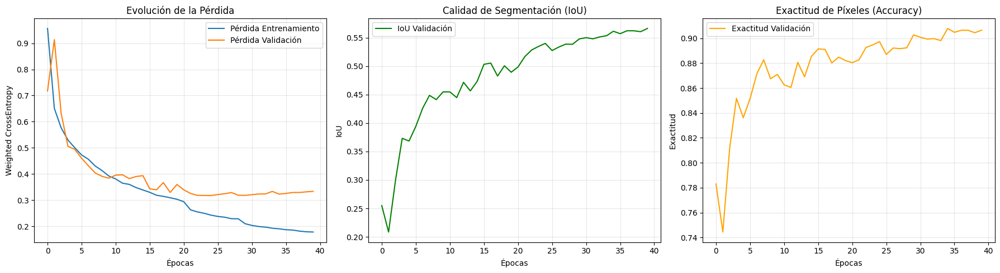

[INFO] Calculando Matriz de Confusión en Set de Prueba...


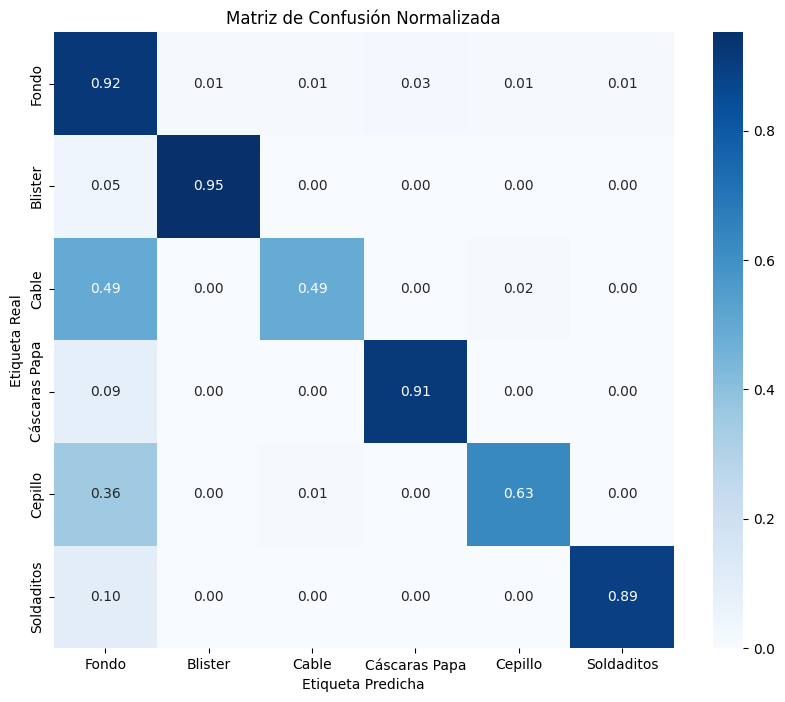

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

print("--- FASE 5.4: MÉTRICAS Y ANÁLISIS DE ERROR ---")

# 1. Visualización de Curvas de Aprendizaje
plt.figure(figsize=(18, 5))

# Curva de Pérdida
plt.subplot(1, 3, 1)
plt.plot(history['train_loss'], label='Pérdida Entrenamiento')
plt.plot(history['val_loss'], label='Pérdida Validación')
plt.title('Evolución de la Pérdida')
plt.xlabel('Épocas')
plt.ylabel('Weighted CrossEntropy')
plt.legend()
plt.grid(True, alpha=0.3)

# Curva de IoU
plt.subplot(1, 3, 2)
plt.plot(history['val_iou'], color='green', label='IoU Validación')
plt.title('Calidad de Segmentación (IoU)')
plt.xlabel('Épocas')
plt.ylabel('IoU')
plt.legend()
plt.grid(True, alpha=0.3)

# Curva de Exactitud
plt.subplot(1, 3, 3)
plt.plot(history['val_acc'], color='orange', label='Exactitud Validación')
plt.title('Exactitud de Píxeles (Accuracy)')
plt.xlabel('Épocas')
plt.ylabel('Exactitud')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 2. Cálculo de Matriz de Confusión (Por lotes para optimizar memoria)
print("[INFO] Calculando Matriz de Confusión en Set de Prueba...")
model.load_state_dict(torch.load(SAVE_PATH)) # Cargar mejores pesos
model.eval()

num_classes = 6
conf_matrix = np.zeros((num_classes, num_classes))

with torch.no_grad():
    for imgs, masks in test_loader:
        imgs = imgs.to(device)
        # Aplanar tensores para comparación píxel a píxel
        masks_np = masks.numpy().flatten()
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1).cpu().numpy().flatten()

        # Acumulación
        conf_matrix += confusion_matrix(masks_np, preds, labels=range(num_classes))

# 3. Normalización y Visualización
# Normalizar por fila (Etiquetas Reales) para obtener porcentajes
row_sums = conf_matrix.sum(axis=1)[:, np.newaxis]
# Evitar división por cero
row_sums[row_sums == 0] = 1
conf_matrix_norm = conf_matrix.astype('float') / row_sums

class_names = ['Fondo', 'Blister', 'Cable', 'Cáscaras Papa', 'Cepillo', 'Soldaditos']

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Etiqueta Predicha')
plt.ylabel('Etiqueta Real')
plt.title('Matriz de Confusión Normalizada')
plt.show()

[INFO] Generando predicciones visuales del Set de Prueba...


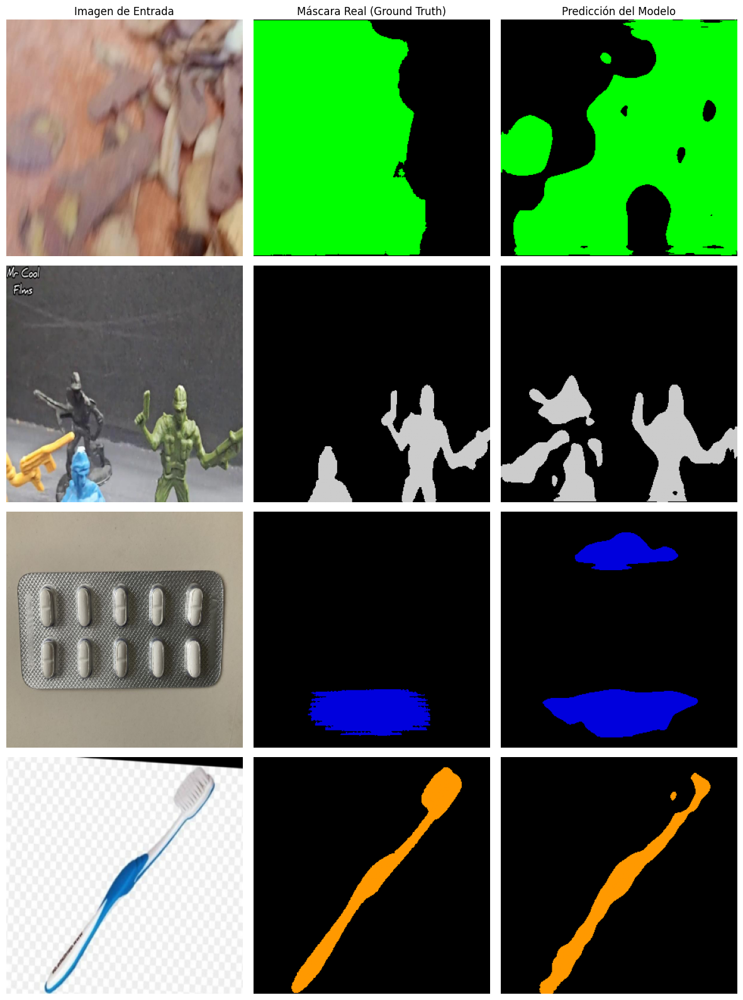

In [25]:
# --- FASE 5.5: VISUALIZACIÓN CUALITATIVA ---
print("[INFO] Generando predicciones visuales del Set de Prueba...")

model.eval()
imgs_test, masks_test = next(iter(test_loader))
imgs_test = imgs_test.to(device)

with torch.no_grad():
    logits = model(imgs_test)
    preds = torch.argmax(logits, dim=1).cpu().numpy()

# Visualización de 4 muestras
fig, axes = plt.subplots(4, 3, figsize=(12, 16))
axes[0,0].set_title("Imagen de Entrada")
axes[0,1].set_title("Máscara Real (Ground Truth)")
axes[0,2].set_title("Predicción del Modelo")

for i in range(4):
    # Entrada
    img_np = imgs_test[i].cpu().permute(1, 2, 0).numpy()
    axes[i, 0].imshow(img_np)
    axes[i, 0].axis('off')

    # Máscara Real
    axes[i, 1].imshow(masks_test[i].numpy(), cmap='nipy_spectral', vmin=0, vmax=5)
    axes[i, 1].axis('off')

    # Predicción
    axes[i, 2].imshow(preds[i], cmap='nipy_spectral', vmin=0, vmax=5)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()